In [3]:
import torch
import time
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor

# create and train a pytorch digit classifier
# source: chatgpt with the prompt "create a pytorch mnist digit classifier"
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms

# Set device to either CUDA or CPU
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("mps")

# Define the neural network architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.dropout = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = nn.functional.relu(nn.functional.max_pool2d(self.conv1(x), 2))
        x = nn.functional.relu(nn.functional.max_pool2d(self.dropout(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return nn.functional.log_softmax(x, dim=1)

# Load the MNIST dataset and apply transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

train_set = datasets.MNIST('../data', train=True, download=True, transform=transform)
test_set = datasets.MNIST('../data', train=False, download=True, transform=transform)

# Set batch size and create data loaders
batch_size = 64

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch_size, shuffle=False)

# Create an instance of the model and send it to the device
model = Net().to(device)

# Define the optimizer and loss function
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)
criterion = nn.CrossEntropyLoss()

# Train the model
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))

    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print('Test set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))



Train Epoch: 0 [0/60000 (0%)]	Loss: 2.306880
Train Epoch: 0 [6400/60000 (11%)]	Loss: 1.568944
Train Epoch: 0 [12800/60000 (21%)]	Loss: 0.504040
Train Epoch: 0 [19200/60000 (32%)]	Loss: 0.529191
Train Epoch: 0 [25600/60000 (43%)]	Loss: 0.393377
Train Epoch: 0 [32000/60000 (53%)]	Loss: 0.441716
Train Epoch: 0 [38400/60000 (64%)]	Loss: 0.392957
Train Epoch: 0 [44800/60000 (75%)]	Loss: 0.211052
Train Epoch: 0 [51200/60000 (85%)]	Loss: 0.299269
Train Epoch: 0 [57600/60000 (96%)]	Loss: 0.254101
Test set: Average loss: 0.0024, Accuracy: 9535/10000 (95%)

Train Epoch: 1 [0/60000 (0%)]	Loss: 0.247385
Train Epoch: 1 [6400/60000 (11%)]	Loss: 0.159558
Train Epoch: 1 [12800/60000 (21%)]	Loss: 0.226734
Train Epoch: 1 [19200/60000 (32%)]	Loss: 0.207231
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.181903
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.160737
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.248452
Train Epoch: 1 [44800/60000 (75%)]	Loss: 0.050994
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.405198
Tr

Epoch 0: g_loss: 3.54597330 d_loss: 0.84767270


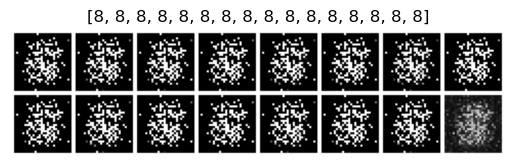

Epoch 1: g_loss: 4.60434866 d_loss: 0.75617558


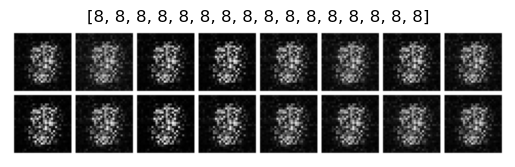

Epoch 2: g_loss: 2.37892342 d_loss: 0.87693202


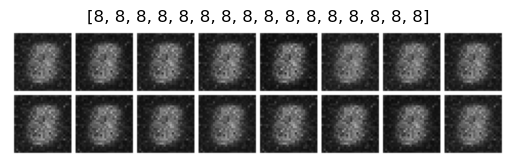

Epoch 3: g_loss: 2.69182444 d_loss: 0.65398151


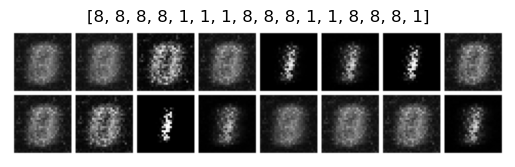

Epoch 4: g_loss: 3.59122443 d_loss: 0.36499575


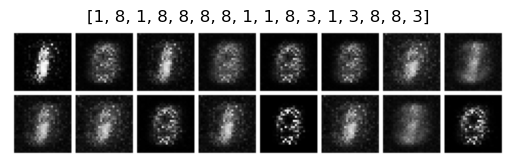

Epoch 5: g_loss: 3.09093547 d_loss: 0.50033510


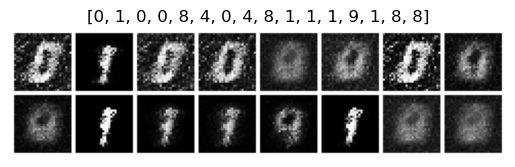

Epoch 6: g_loss: 2.98679471 d_loss: 0.47793069


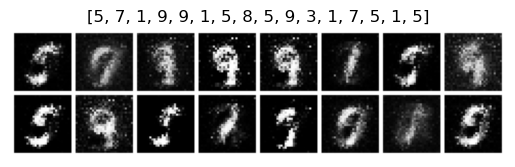

Epoch 7: g_loss: 2.95036793 d_loss: 0.49166936


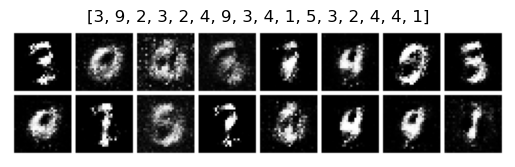

Epoch 8: g_loss: 2.59550738 d_loss: 0.58716542


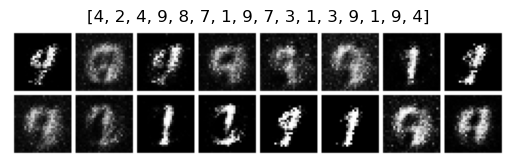

Epoch 9: g_loss: 2.44502139 d_loss: 0.63819194


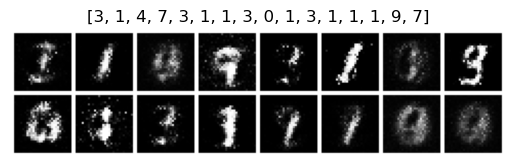

Epoch 10: g_loss: 2.32733607 d_loss: 0.65664500


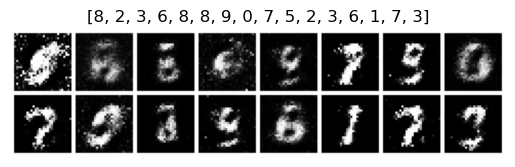

Epoch 11: g_loss: 2.17711258 d_loss: 0.70037746


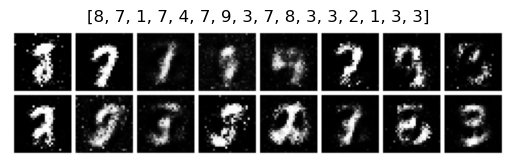

Epoch 12: g_loss: 2.06012583 d_loss: 0.72797781


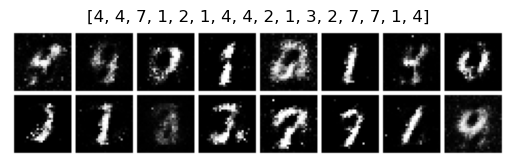

Epoch 13: g_loss: 1.94515288 d_loss: 0.78358245


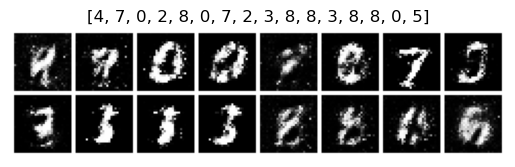

Epoch 14: g_loss: 1.83653843 d_loss: 0.81720024


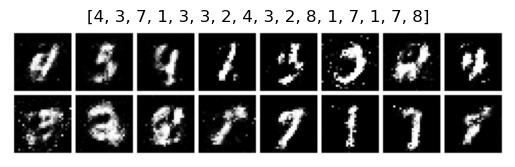

Epoch 15: g_loss: 1.81877255 d_loss: 0.82602334


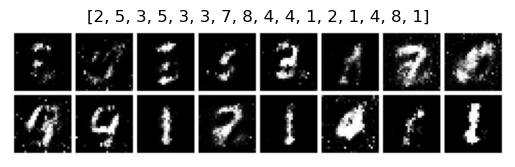

Epoch 16: g_loss: 1.79322183 d_loss: 0.83451444


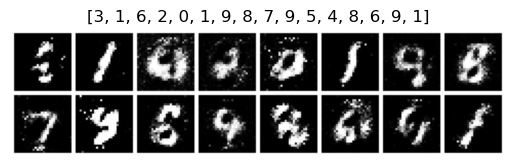

Epoch 17: g_loss: 1.77637124 d_loss: 0.84002072


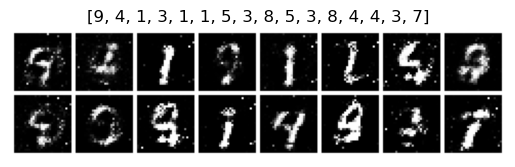

Epoch 18: g_loss: 1.72899592 d_loss: 0.86751336


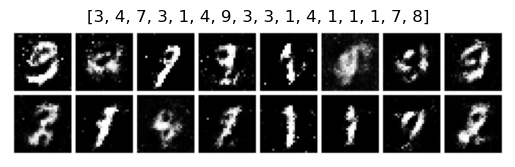

Epoch 19: g_loss: 1.75134635 d_loss: 0.83848256


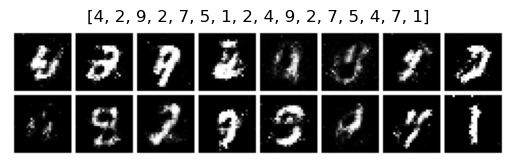

Epoch 20: g_loss: 1.74241960 d_loss: 0.85984147


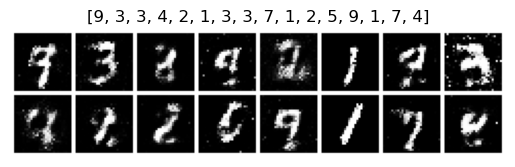

Epoch 21: g_loss: 1.66598845 d_loss: 0.88502514


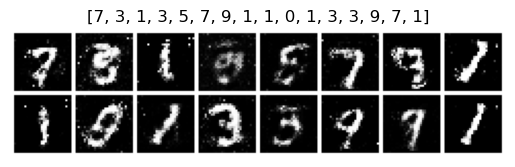

Epoch 22: g_loss: 1.61014259 d_loss: 0.89966697


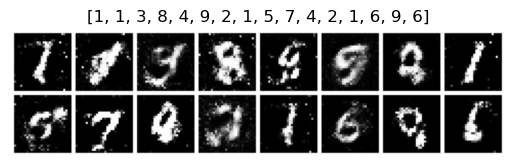

Epoch 23: g_loss: 1.56164074 d_loss: 0.92442816


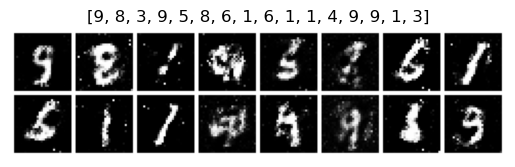

Epoch 24: g_loss: 1.47896850 d_loss: 0.98328418


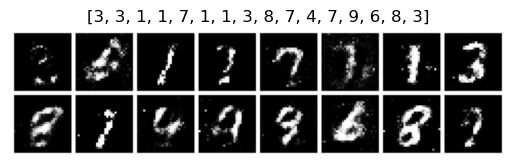

Epoch 25: g_loss: 1.52649486 d_loss: 0.94446826


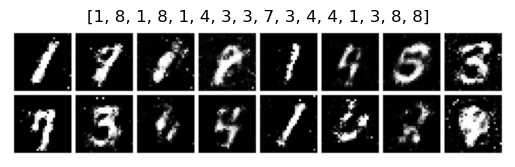

Epoch 26: g_loss: 1.53502989 d_loss: 0.93897897


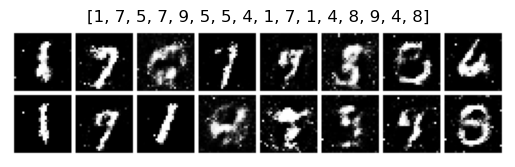

Epoch 27: g_loss: 1.50877857 d_loss: 0.95547438


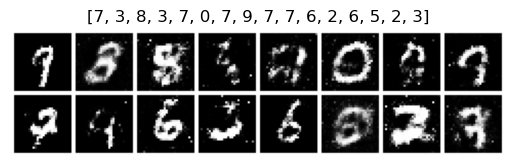

Epoch 28: g_loss: 1.42010176 d_loss: 0.99958473


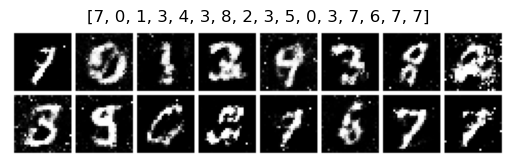

Epoch 29: g_loss: 1.45932710 d_loss: 0.97806871


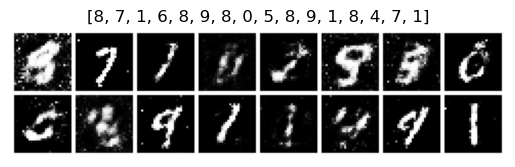

Epoch 30: g_loss: 1.37242615 d_loss: 1.01121449


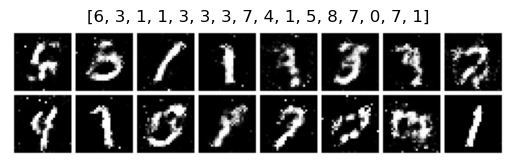

Epoch 31: g_loss: 1.37945879 d_loss: 1.01243901


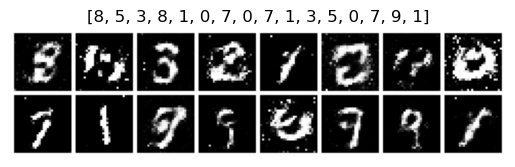

Epoch 32: g_loss: 1.39327133 d_loss: 1.01150215


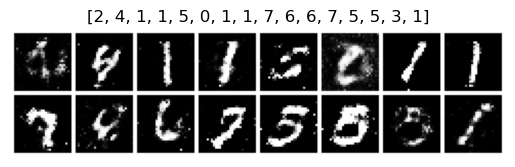

Epoch 33: g_loss: 1.30658197 d_loss: 1.04723394


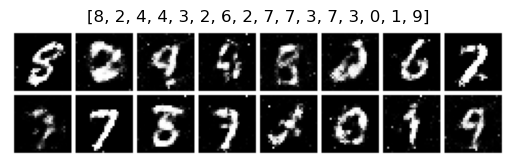

Epoch 34: g_loss: 1.27625430 d_loss: 1.06363714


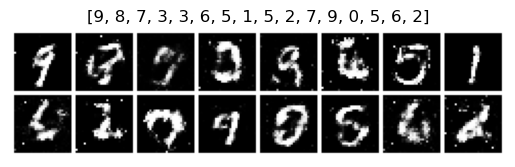

Epoch 35: g_loss: 1.25894427 d_loss: 1.07831109


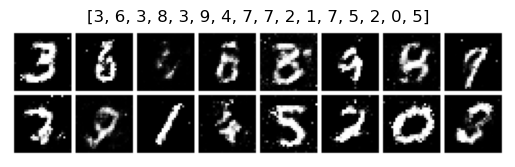

Epoch 36: g_loss: 1.25582242 d_loss: 1.07238936


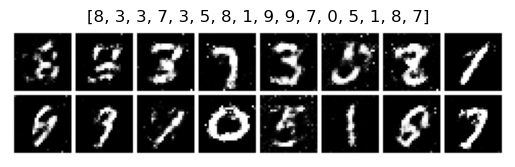

Epoch 37: g_loss: 1.22952223 d_loss: 1.08215272


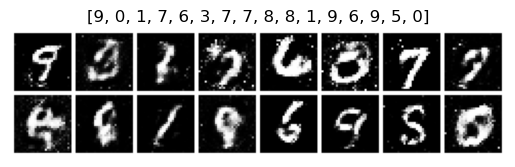

Epoch 38: g_loss: 1.22725475 d_loss: 1.08702767


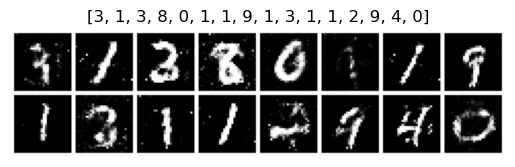

Epoch 39: g_loss: 1.21653736 d_loss: 1.09299541


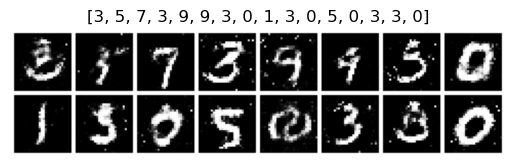

Epoch 40: g_loss: 1.17294931 d_loss: 1.11498523


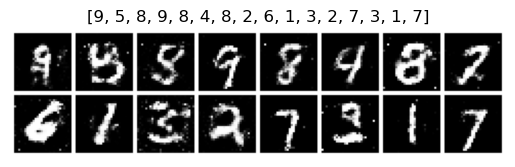

Epoch 41: g_loss: 1.14928591 d_loss: 1.14364815


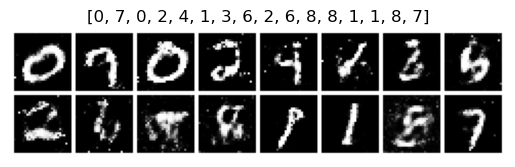

Epoch 42: g_loss: 1.14838147 d_loss: 1.13423800


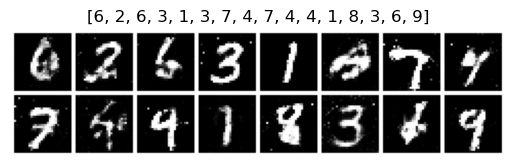

Epoch 43: g_loss: 1.13687730 d_loss: 1.14201701


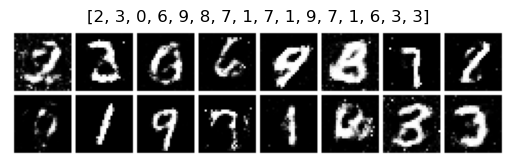

Epoch 44: g_loss: 1.12058914 d_loss: 1.15755987


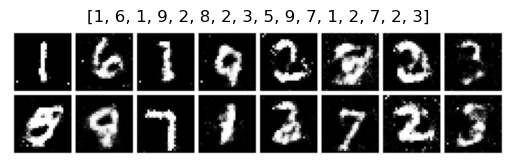

Epoch 45: g_loss: 1.11095846 d_loss: 1.15129220


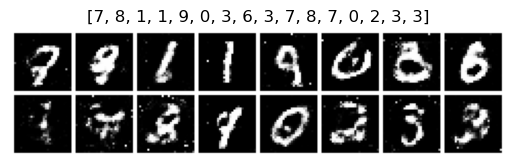

Epoch 46: g_loss: 1.08273602 d_loss: 1.16869748


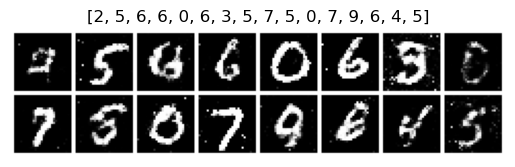

Epoch 47: g_loss: 1.09156775 d_loss: 1.15739357


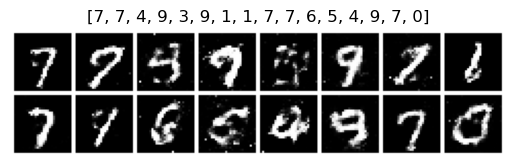

Epoch 48: g_loss: 1.09742713 d_loss: 1.16598761


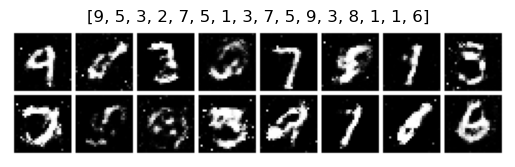

Epoch 49: g_loss: 1.08721924 d_loss: 1.16505396


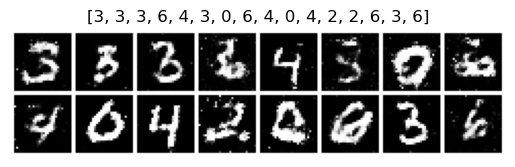

Epoch 50: g_loss: 1.06637752 d_loss: 1.17484188


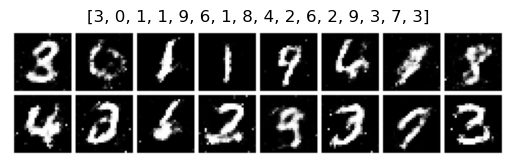

Epoch 51: g_loss: 1.05629790 d_loss: 1.17920482


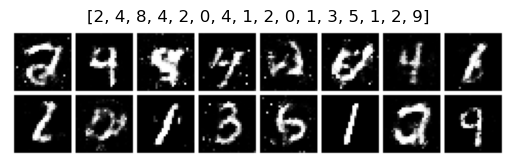

Epoch 52: g_loss: 1.08809936 d_loss: 1.17735004


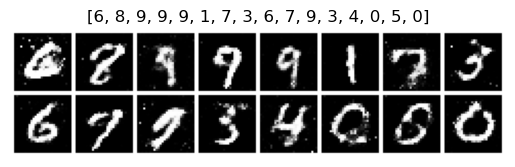

Epoch 53: g_loss: 1.06049073 d_loss: 1.18635988


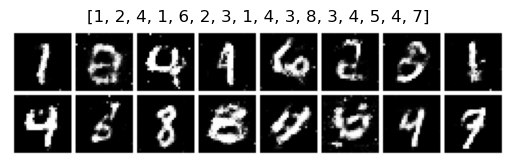

Epoch 54: g_loss: 1.03991997 d_loss: 1.18846214


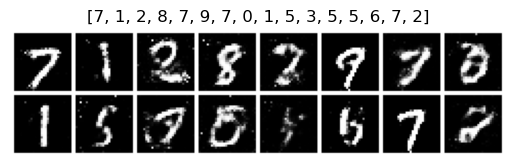

Epoch 55: g_loss: 1.02002156 d_loss: 1.20673466


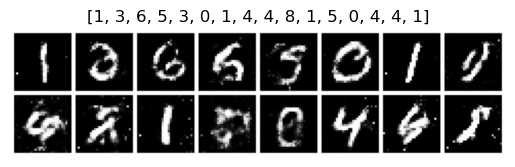

Epoch 56: g_loss: 1.05194163 d_loss: 1.19396281


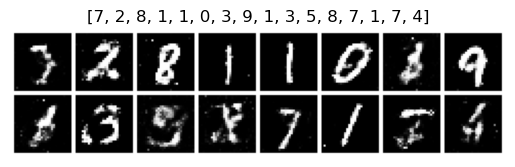

Epoch 57: g_loss: 1.04672480 d_loss: 1.18618429


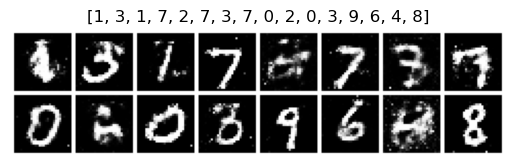

Epoch 58: g_loss: 1.04889250 d_loss: 1.19088459


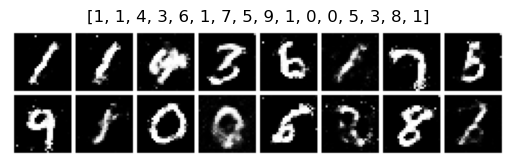

Epoch 59: g_loss: 1.05305493 d_loss: 1.18682873


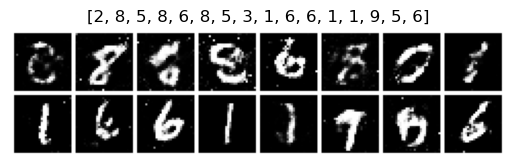

Epoch 60: g_loss: 1.05756652 d_loss: 1.18416071


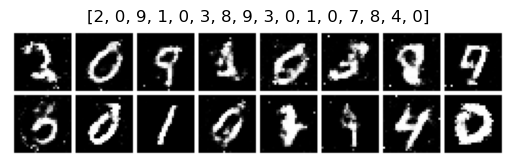

Epoch 61: g_loss: 1.03906393 d_loss: 1.20127022


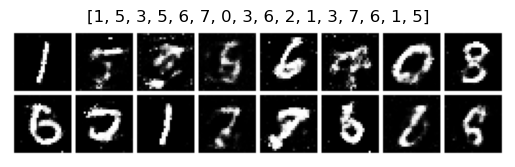

Epoch 62: g_loss: 1.02122808 d_loss: 1.20192862


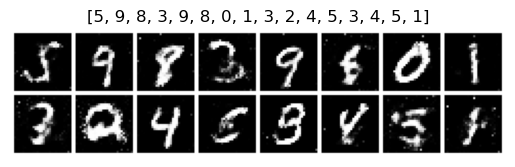

Epoch 63: g_loss: 1.01302803 d_loss: 1.20752811


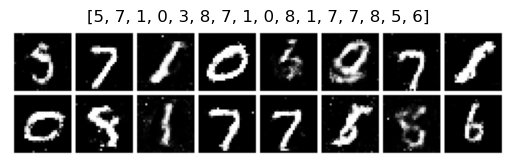

Epoch 64: g_loss: 1.02325237 d_loss: 1.20305097


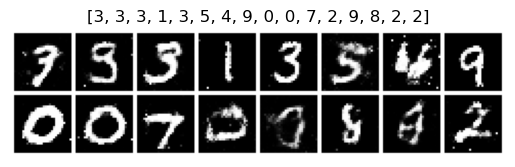

Epoch 65: g_loss: 1.01624393 d_loss: 1.20790267


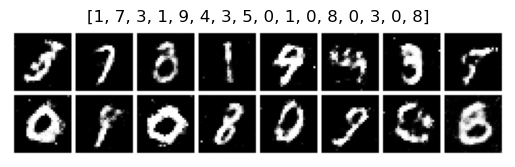

Epoch 66: g_loss: 1.01408374 d_loss: 1.20594120


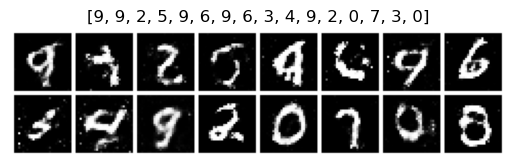

Epoch 67: g_loss: 1.02181375 d_loss: 1.20758367


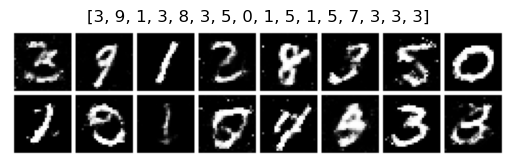

Epoch 68: g_loss: 1.00956583 d_loss: 1.21264684


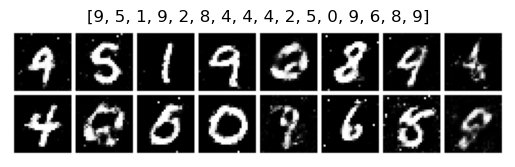

Epoch 69: g_loss: 0.99958956 d_loss: 1.21485317


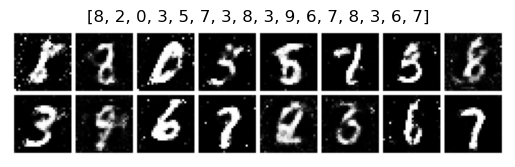

Epoch 70: g_loss: 0.99669176 d_loss: 1.21865785


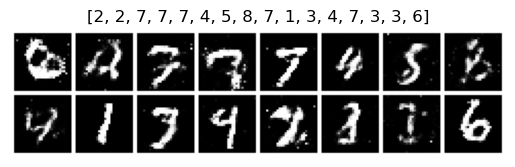

Epoch 71: g_loss: 1.00237119 d_loss: 1.22078001


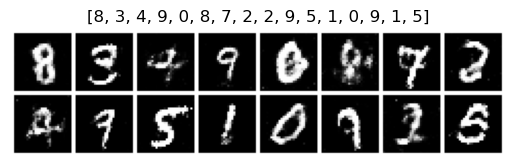

Epoch 72: g_loss: 0.99105978 d_loss: 1.21633673


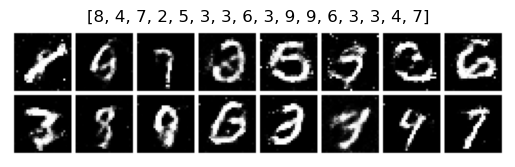

Epoch 73: g_loss: 0.97769940 d_loss: 1.22988510


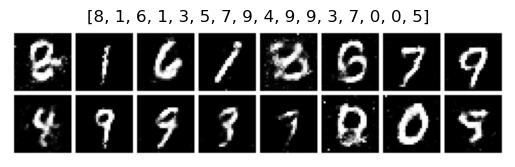

Epoch 74: g_loss: 0.99057353 d_loss: 1.22803867


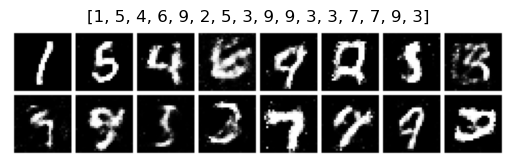

Epoch 75: g_loss: 0.97456795 d_loss: 1.22644842


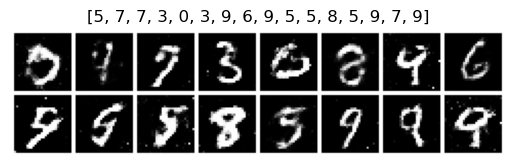

Epoch 76: g_loss: 0.97062904 d_loss: 1.23745441


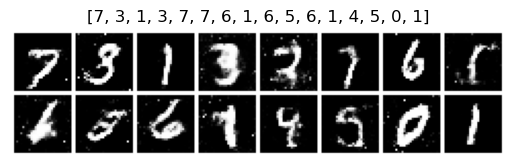

Epoch 77: g_loss: 0.97449148 d_loss: 1.23129630


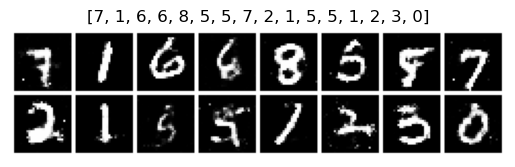

Epoch 78: g_loss: 0.96631521 d_loss: 1.22721696


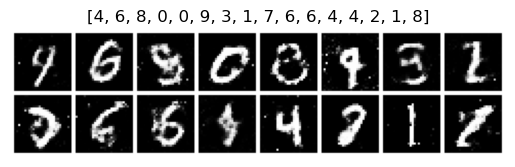

Epoch 79: g_loss: 0.96303111 d_loss: 1.24057615


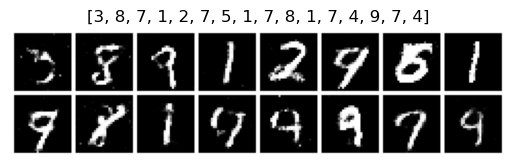

Epoch 80: g_loss: 0.95758033 d_loss: 1.24280703


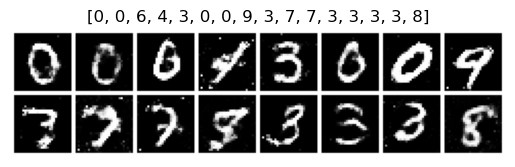

Epoch 81: g_loss: 0.95475733 d_loss: 1.24060154


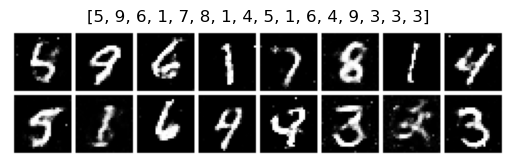

Epoch 82: g_loss: 0.93880475 d_loss: 1.25313938


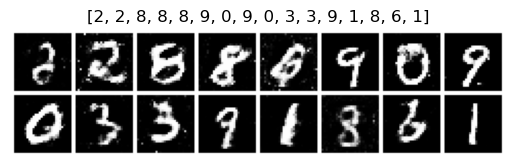

Epoch 83: g_loss: 0.96022147 d_loss: 1.24298215


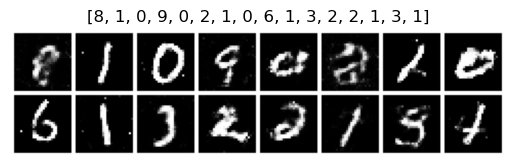

Epoch 84: g_loss: 0.96467990 d_loss: 1.23520625


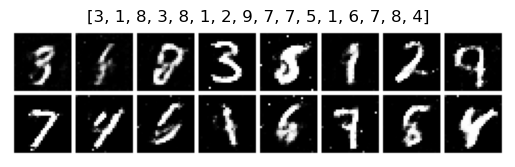

Epoch 85: g_loss: 0.97595161 d_loss: 1.24142551


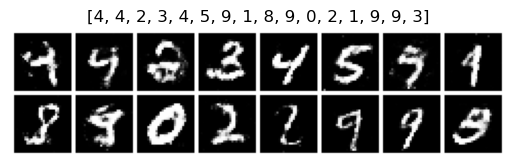

Epoch 86: g_loss: 0.95754313 d_loss: 1.24236584


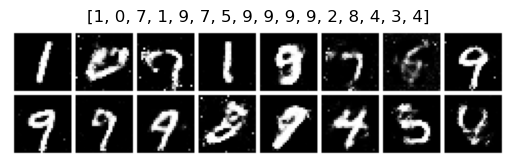

Epoch 87: g_loss: 0.94635689 d_loss: 1.25036025


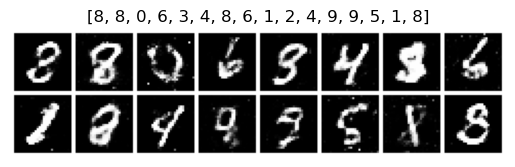

Epoch 88: g_loss: 0.93986219 d_loss: 1.25062323


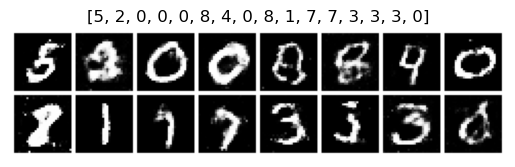

Epoch 89: g_loss: 0.95014006 d_loss: 1.25258839


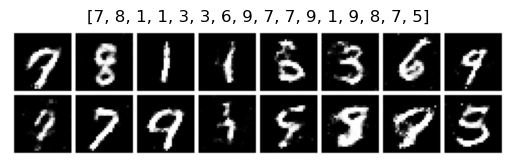

Epoch 90: g_loss: 0.94848353 d_loss: 1.25054908


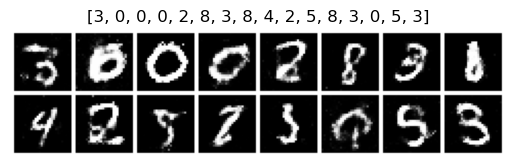

Epoch 91: g_loss: 0.96609020 d_loss: 1.23679900


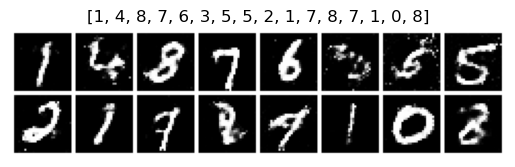

Epoch 92: g_loss: 0.94544405 d_loss: 1.25432408


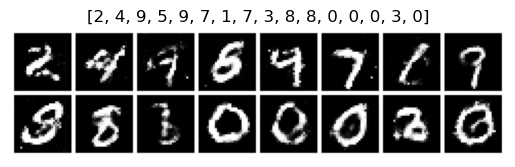

Epoch 93: g_loss: 0.93240428 d_loss: 1.25853169


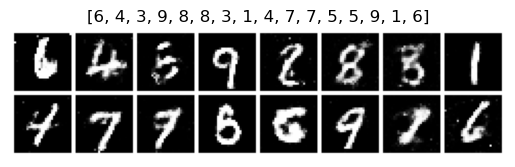

Epoch 94: g_loss: 0.93051732 d_loss: 1.25616717


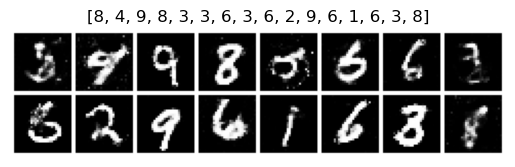

Epoch 95: g_loss: 0.93303859 d_loss: 1.25607717


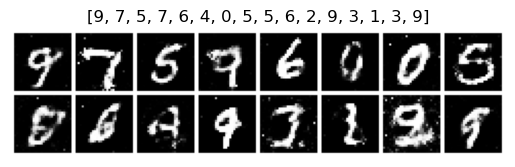

Epoch 96: g_loss: 0.96139842 d_loss: 1.24686456


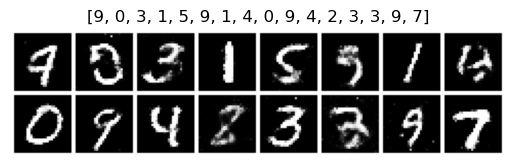

Epoch 97: g_loss: 0.94031739 d_loss: 1.24917316


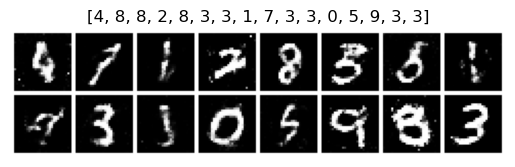

Epoch 98: g_loss: 0.93176591 d_loss: 1.25519538


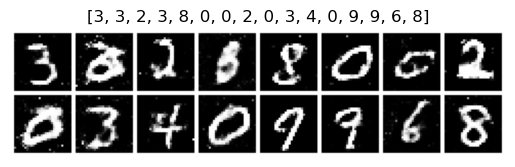

Epoch 99: g_loss: 0.93149316 d_loss: 1.25260651


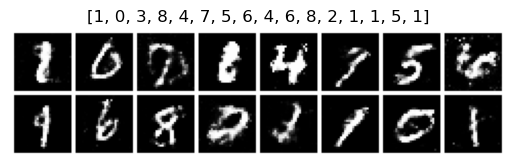

Epoch 100: g_loss: 0.94926661 d_loss: 1.25579715


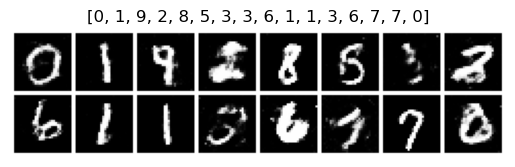

Epoch 101: g_loss: 0.95800126 d_loss: 1.24892879


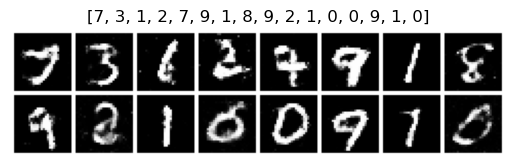

Epoch 102: g_loss: 0.94398487 d_loss: 1.24822593


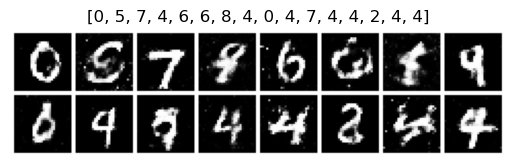

Epoch 103: g_loss: 0.94205469 d_loss: 1.24704278


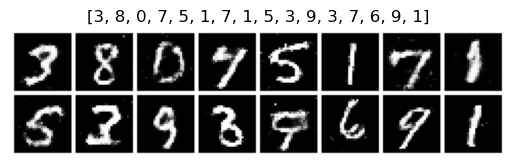

Epoch 104: g_loss: 0.94273025 d_loss: 1.25323200


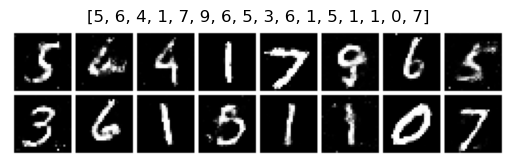

Epoch 105: g_loss: 0.95535636 d_loss: 1.24413621


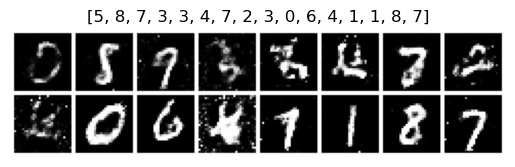

Epoch 106: g_loss: 0.92982340 d_loss: 1.25787795


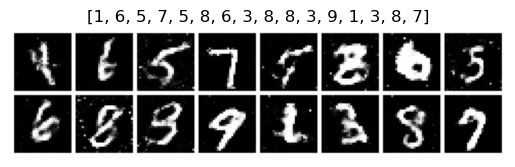

Epoch 107: g_loss: 0.92403096 d_loss: 1.26607168


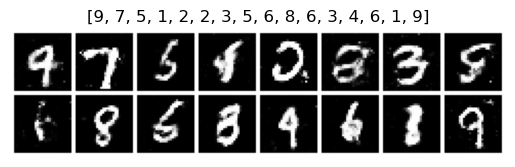

Epoch 108: g_loss: 0.93538964 d_loss: 1.25420892


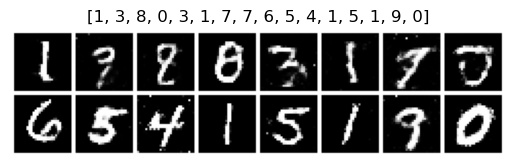

Epoch 109: g_loss: 0.91648287 d_loss: 1.26446724


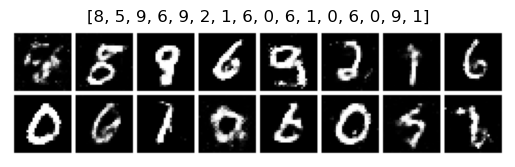

Epoch 110: g_loss: 0.93189025 d_loss: 1.25587237


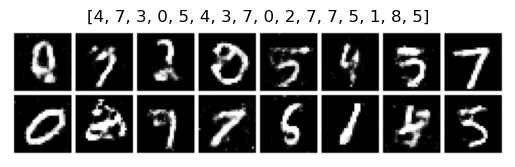

Epoch 111: g_loss: 0.91946584 d_loss: 1.26220107


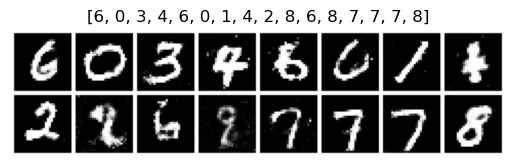

Epoch 112: g_loss: 0.92484879 d_loss: 1.25781953


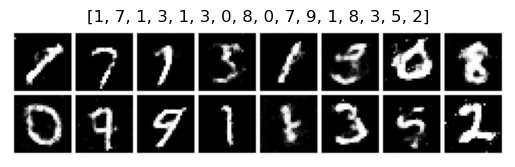

Epoch 113: g_loss: 0.94312960 d_loss: 1.25247788


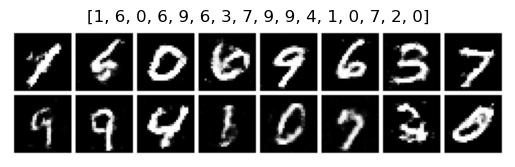

Epoch 114: g_loss: 0.93714631 d_loss: 1.25372052


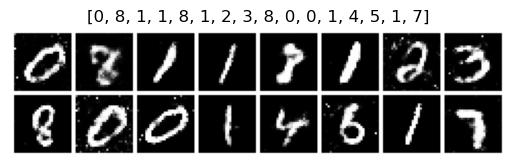

Epoch 115: g_loss: 0.92703873 d_loss: 1.26122403


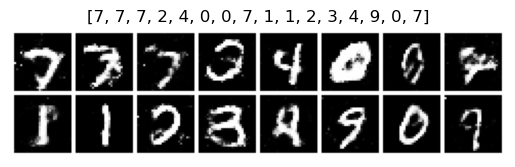

Epoch 116: g_loss: 0.92025608 d_loss: 1.26216400


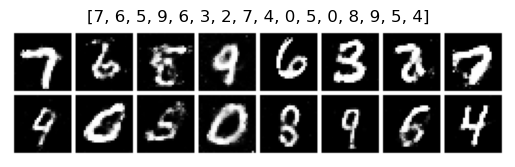

Epoch 117: g_loss: 0.91647524 d_loss: 1.26656222


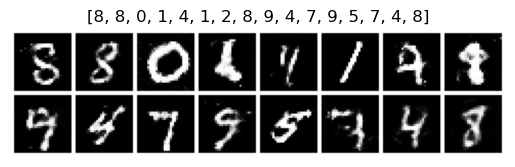

Epoch 118: g_loss: 0.91638118 d_loss: 1.26716542


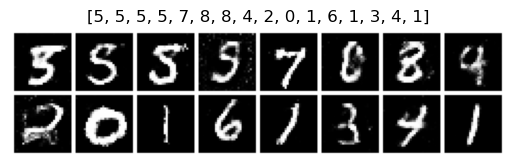

Epoch 119: g_loss: 0.91939402 d_loss: 1.26144457


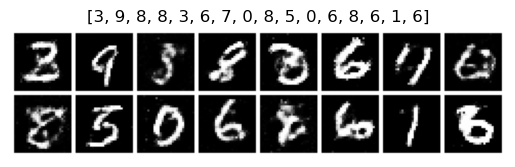

Epoch 120: g_loss: 0.90721637 d_loss: 1.26740921


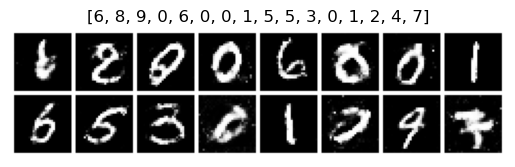

Epoch 121: g_loss: 0.91614580 d_loss: 1.26779699


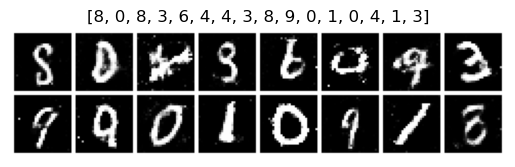

Epoch 122: g_loss: 0.91150814 d_loss: 1.27331734


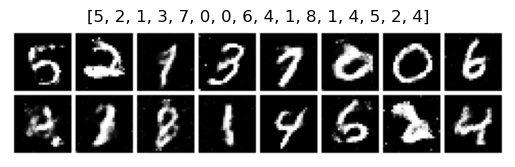

Epoch 123: g_loss: 0.91697079 d_loss: 1.26519465


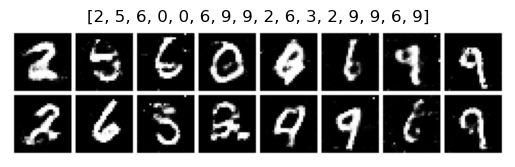

Epoch 124: g_loss: 0.93562031 d_loss: 1.26669931


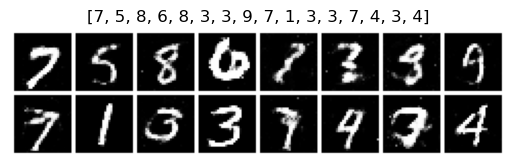

Epoch 125: g_loss: 0.92430586 d_loss: 1.25506175


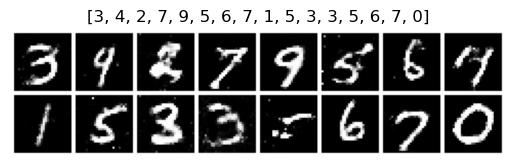

Epoch 126: g_loss: 0.90782171 d_loss: 1.26653087


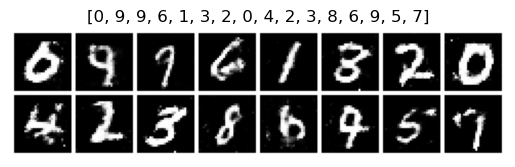

Epoch 127: g_loss: 0.91090107 d_loss: 1.27009225


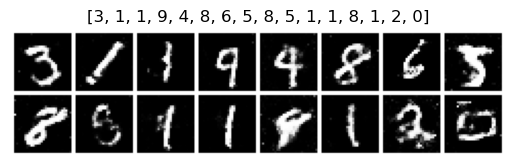

Epoch 128: g_loss: 0.91631800 d_loss: 1.26308084


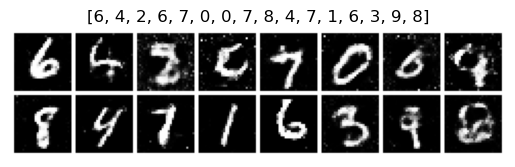

Epoch 129: g_loss: 0.90134829 d_loss: 1.27626455


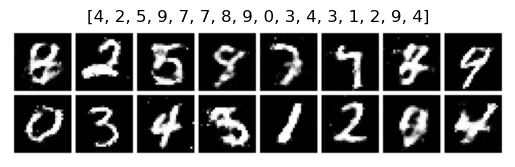

Epoch 130: g_loss: 0.90707225 d_loss: 1.26783824


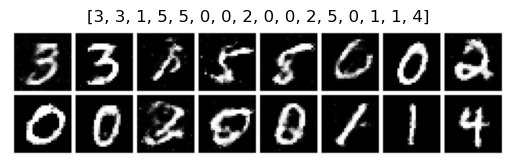

Epoch 131: g_loss: 0.89786077 d_loss: 1.27164555


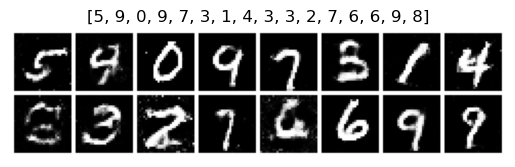

Epoch 132: g_loss: 0.90553153 d_loss: 1.26925492


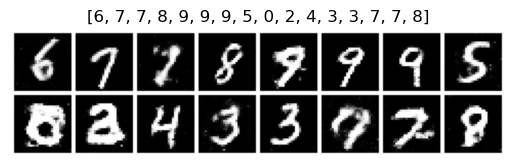

Epoch 133: g_loss: 0.90410590 d_loss: 1.27550364


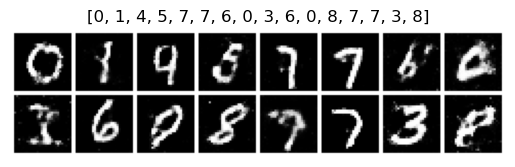

Epoch 134: g_loss: 0.91380334 d_loss: 1.26891959


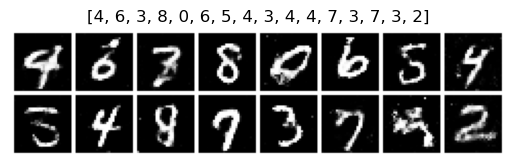

Epoch 135: g_loss: 0.91229206 d_loss: 1.26790082


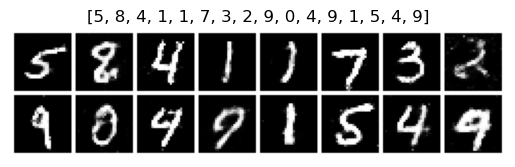

Epoch 136: g_loss: 0.91679573 d_loss: 1.26824570


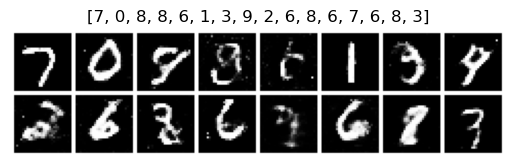

Epoch 137: g_loss: 0.90575367 d_loss: 1.26760972


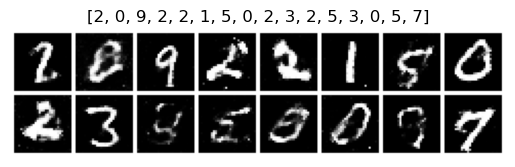

Epoch 138: g_loss: 0.89573580 d_loss: 1.27661109


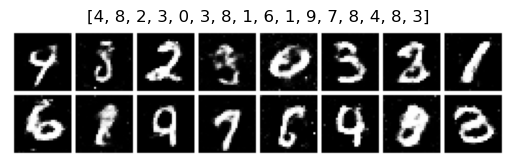

Epoch 139: g_loss: 0.91791749 d_loss: 1.26639402


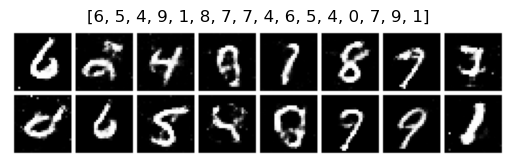

Epoch 140: g_loss: 0.89563096 d_loss: 1.27311766


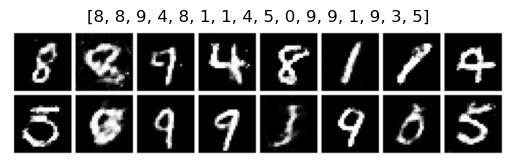

Epoch 141: g_loss: 0.90215880 d_loss: 1.27747440


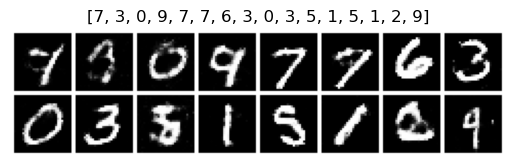

Epoch 142: g_loss: 0.90668809 d_loss: 1.27122641


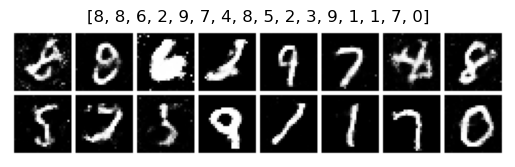

Epoch 143: g_loss: 0.90539688 d_loss: 1.26636648


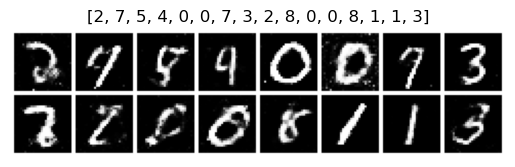

Epoch 144: g_loss: 0.90391433 d_loss: 1.27341902


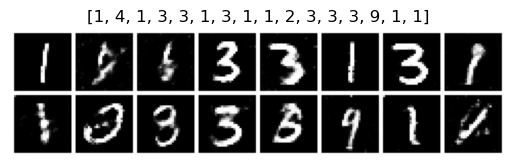

Epoch 145: g_loss: 0.89814889 d_loss: 1.27641022


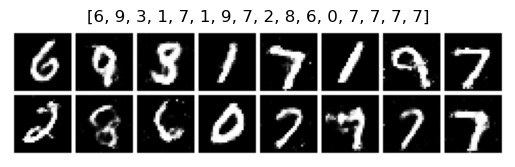

Epoch 146: g_loss: 0.90132385 d_loss: 1.27740145


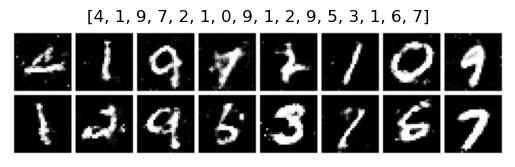

Epoch 147: g_loss: 0.89968693 d_loss: 1.27184677


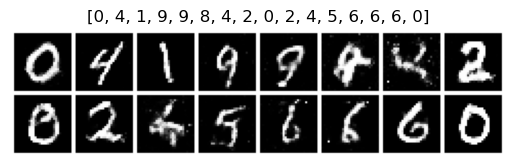

Epoch 148: g_loss: 0.89952254 d_loss: 1.27696240


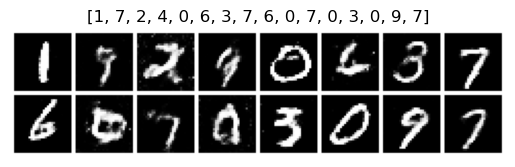

Epoch 149: g_loss: 0.90011752 d_loss: 1.27543747


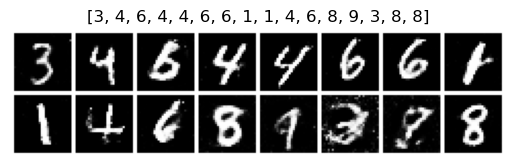

Epoch 150: g_loss: 0.90261590 d_loss: 1.27581501


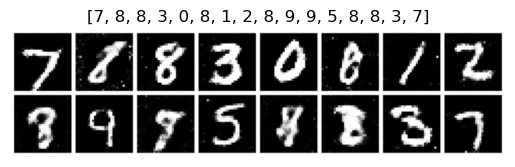

Epoch 151: g_loss: 0.90706515 d_loss: 1.27691257


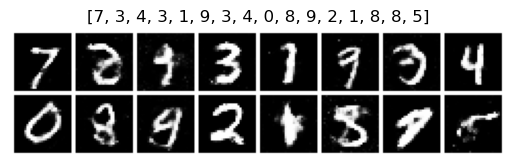

Epoch 152: g_loss: 0.88847327 d_loss: 1.28364849


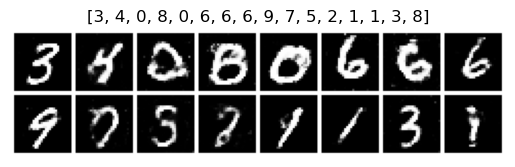

Epoch 153: g_loss: 0.89722270 d_loss: 1.27491653


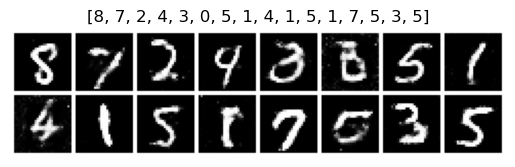

Epoch 154: g_loss: 0.89259094 d_loss: 1.27605307


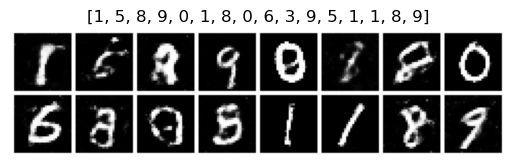

Epoch 155: g_loss: 0.88315719 d_loss: 1.28196669


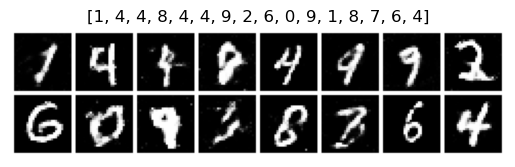

Epoch 156: g_loss: 0.88523197 d_loss: 1.28463459


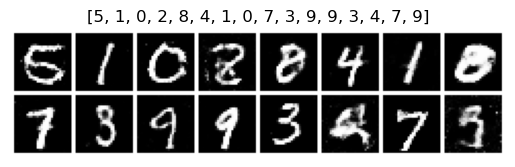

Epoch 157: g_loss: 0.89558971 d_loss: 1.28097224


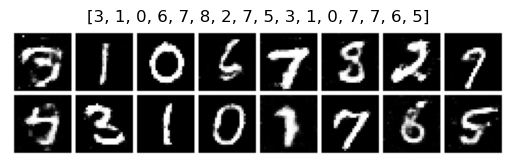

Epoch 158: g_loss: 0.90078461 d_loss: 1.27522135


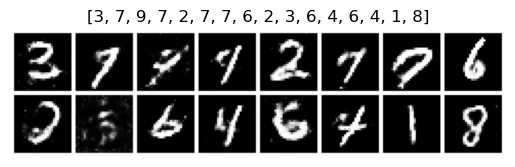

Epoch 159: g_loss: 0.89167243 d_loss: 1.27836192


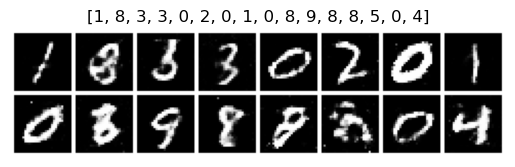

Epoch 160: g_loss: 0.89141214 d_loss: 1.28111887


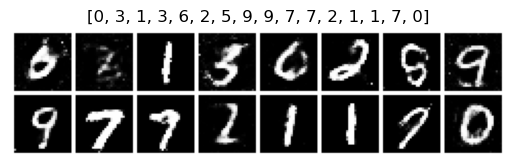

Epoch 161: g_loss: 0.88664615 d_loss: 1.28385282


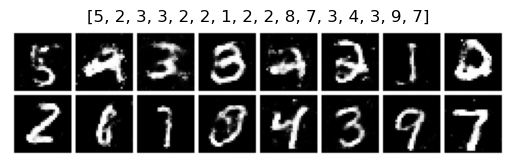

Epoch 162: g_loss: 0.89974242 d_loss: 1.27717650


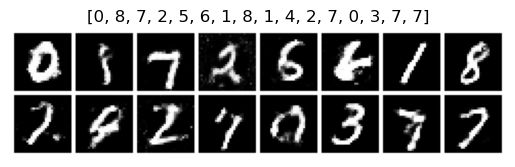

Epoch 163: g_loss: 0.89345402 d_loss: 1.27853525


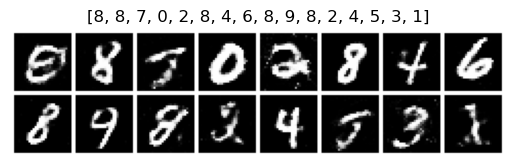

Epoch 164: g_loss: 0.89936566 d_loss: 1.27500677


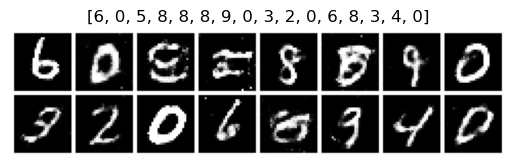

Epoch 165: g_loss: 0.90396315 d_loss: 1.27837908


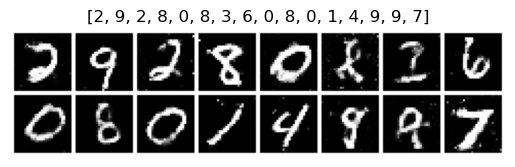

Epoch 166: g_loss: 0.89431071 d_loss: 1.27860570


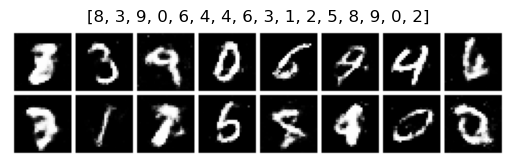

Epoch 167: g_loss: 0.88829637 d_loss: 1.28160715


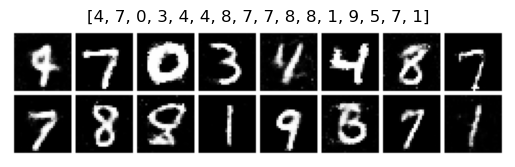

Epoch 168: g_loss: 0.89117604 d_loss: 1.27909172


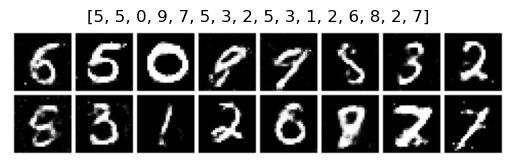

Epoch 169: g_loss: 0.87646258 d_loss: 1.28452277


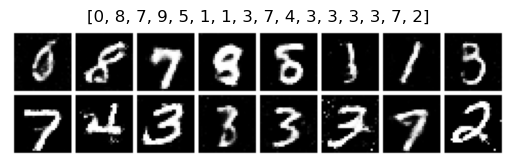

Epoch 170: g_loss: 0.88054633 d_loss: 1.28652442


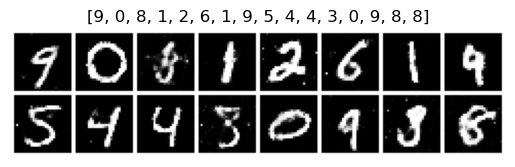

Epoch 171: g_loss: 0.90096271 d_loss: 1.27867806


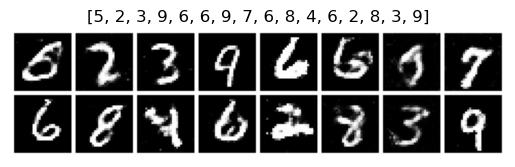

Epoch 172: g_loss: 0.90770543 d_loss: 1.27400959


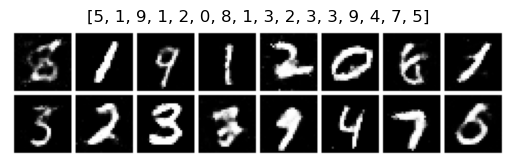

Epoch 173: g_loss: 0.89456528 d_loss: 1.27948248


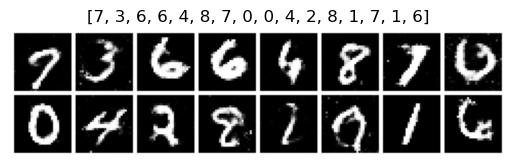

Epoch 174: g_loss: 0.88118309 d_loss: 1.28575063


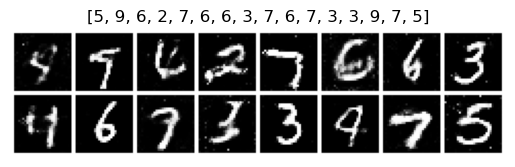

Epoch 175: g_loss: 0.87285322 d_loss: 1.29008079


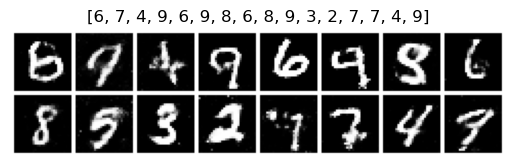

Epoch 176: g_loss: 0.88884681 d_loss: 1.28295636


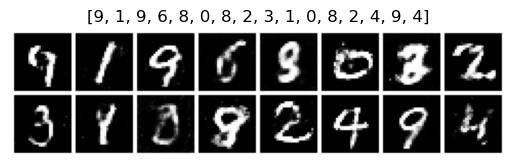

Epoch 177: g_loss: 0.88578457 d_loss: 1.28091335


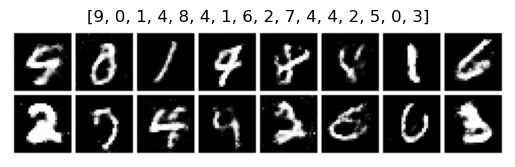

Epoch 178: g_loss: 0.87585670 d_loss: 1.28714979


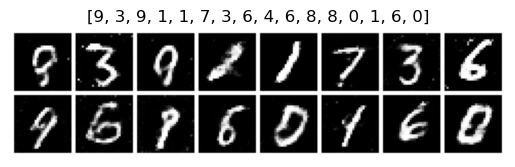

Epoch 179: g_loss: 0.88842475 d_loss: 1.28460193


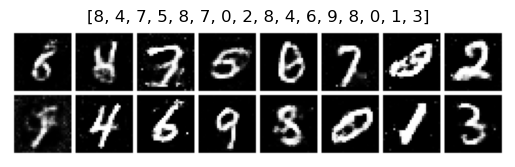

Epoch 180: g_loss: 0.88189846 d_loss: 1.28320932


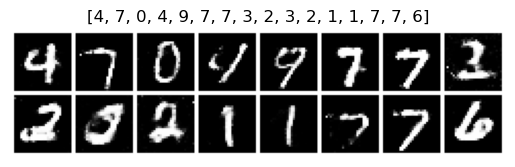

Epoch 181: g_loss: 0.88165891 d_loss: 1.28487885


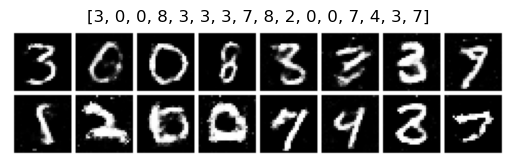

Epoch 182: g_loss: 0.87880445 d_loss: 1.28539884


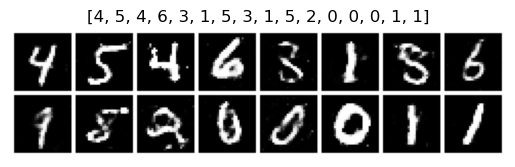

Epoch 183: g_loss: 0.88311267 d_loss: 1.28528333


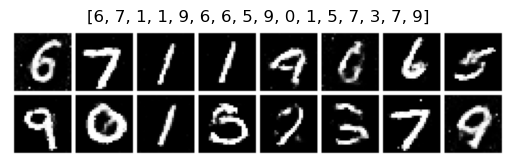

Epoch 184: g_loss: 0.88284761 d_loss: 1.28888023


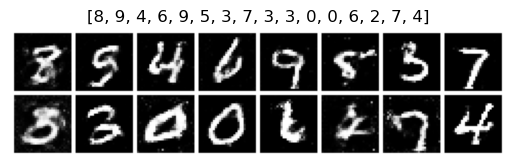

Epoch 185: g_loss: 0.87971681 d_loss: 1.28661513


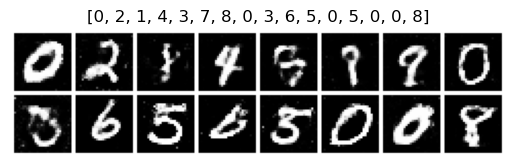

Epoch 186: g_loss: 0.87977111 d_loss: 1.28508413


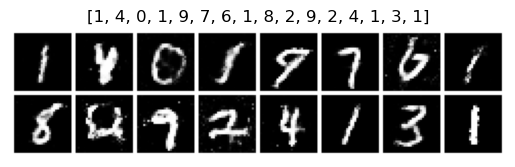

Epoch 187: g_loss: 0.89593333 d_loss: 1.27912021


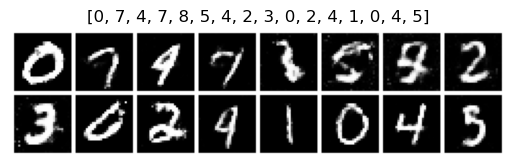

Epoch 188: g_loss: 0.88467228 d_loss: 1.28215885


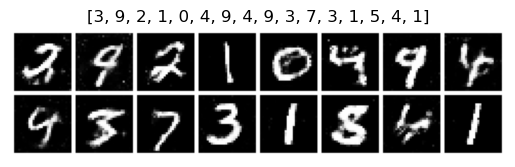

Epoch 189: g_loss: 0.89648646 d_loss: 1.28237879


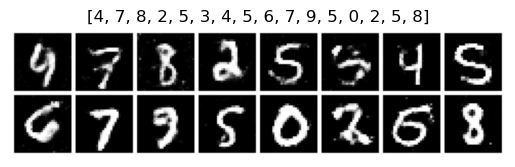

Epoch 190: g_loss: 0.88726264 d_loss: 1.28358233


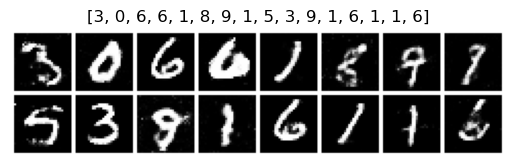

Epoch 191: g_loss: 0.88346857 d_loss: 1.28716707


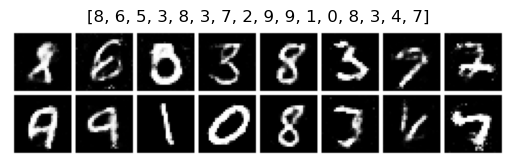

Epoch 192: g_loss: 0.88692534 d_loss: 1.28364062


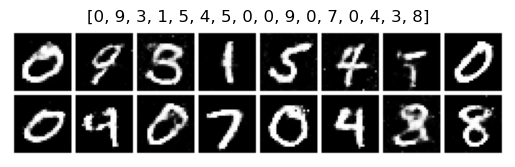

Epoch 193: g_loss: 0.89165175 d_loss: 1.27933478


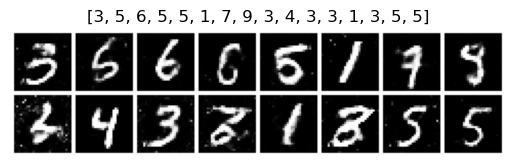

Epoch 194: g_loss: 0.88713932 d_loss: 1.27860844


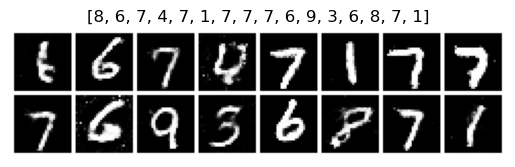

Epoch 195: g_loss: 0.88755077 d_loss: 1.28558910


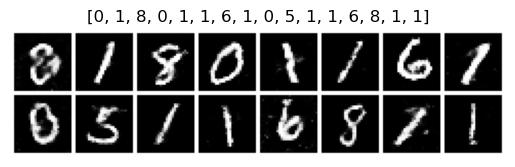

Epoch 196: g_loss: 0.88145465 d_loss: 1.28465831


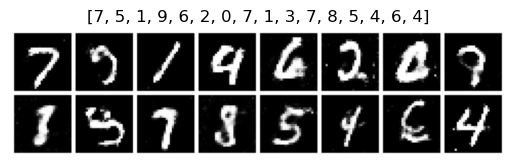

Epoch 197: g_loss: 0.87775815 d_loss: 1.28685939


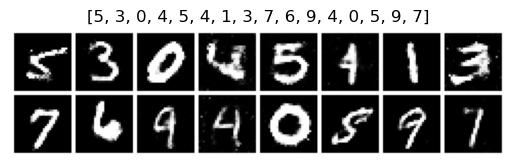

Epoch 198: g_loss: 0.88758761 d_loss: 1.28603327


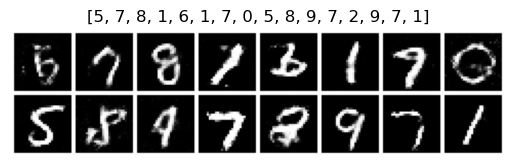

Epoch 199: g_loss: 0.89368165 d_loss: 1.27903807


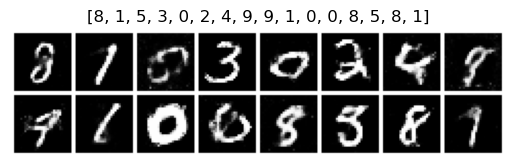

Epoch 200: g_loss: 0.87222886 d_loss: 1.28765559


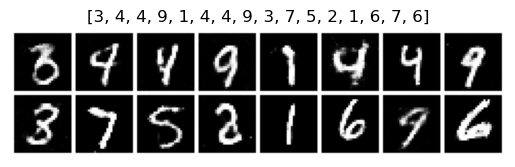

Epoch 201: g_loss: 0.88340318 d_loss: 1.28497636


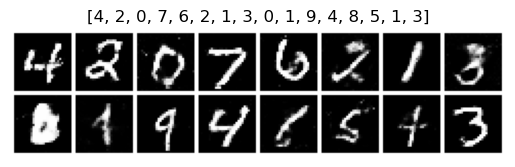

Epoch 202: g_loss: 0.88132226 d_loss: 1.28535831


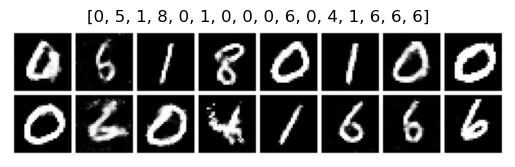

Epoch 203: g_loss: 0.87998772 d_loss: 1.28667271


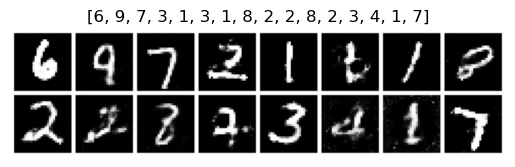

Epoch 204: g_loss: 0.88171840 d_loss: 1.28430462


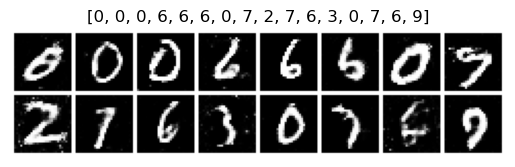

Epoch 205: g_loss: 0.88439453 d_loss: 1.28295910


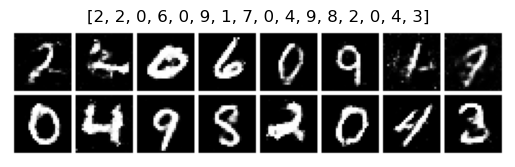

Epoch 206: g_loss: 0.87158680 d_loss: 1.29025829


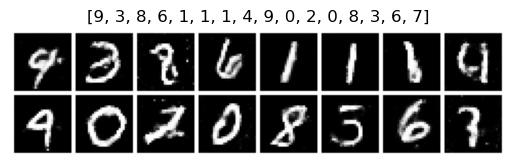

Epoch 207: g_loss: 0.88227355 d_loss: 1.28893244


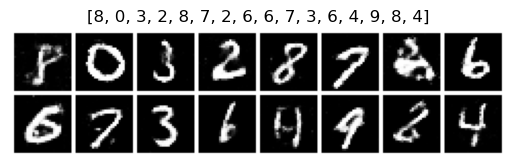

Epoch 208: g_loss: 0.89240521 d_loss: 1.28497362


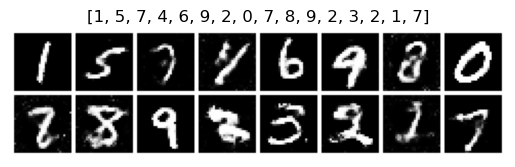

Epoch 209: g_loss: 0.86577082 d_loss: 1.29214716


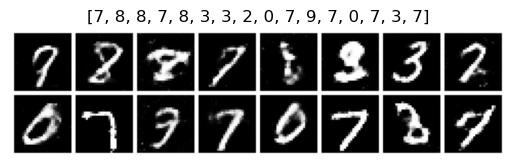

Epoch 210: g_loss: 0.87728566 d_loss: 1.28992939


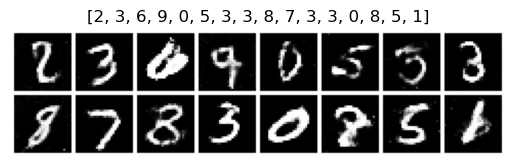

Epoch 211: g_loss: 0.88160652 d_loss: 1.29152513


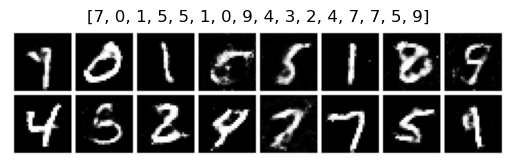

Epoch 212: g_loss: 0.88765776 d_loss: 1.28392625


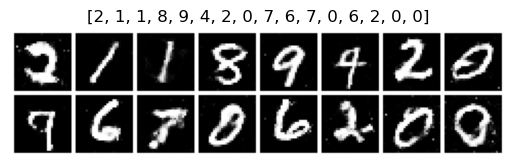

Epoch 213: g_loss: 0.89329278 d_loss: 1.28020406


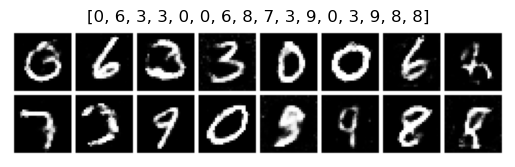

Epoch 214: g_loss: 0.88791496 d_loss: 1.28298318


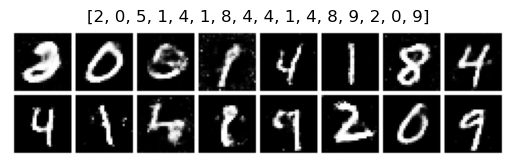

Epoch 215: g_loss: 0.87117034 d_loss: 1.28880024


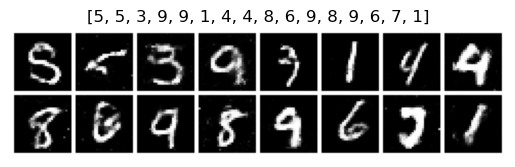

Epoch 216: g_loss: 0.87438393 d_loss: 1.29152656


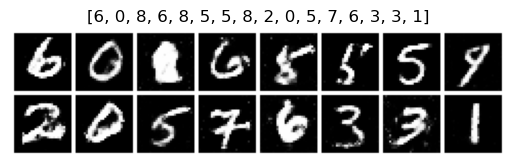

Epoch 217: g_loss: 0.89206457 d_loss: 1.28153384


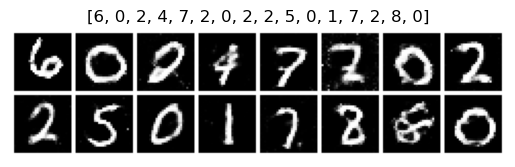

Epoch 218: g_loss: 0.88561273 d_loss: 1.28643560


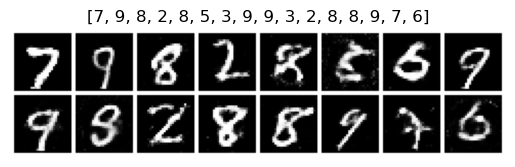

Epoch 219: g_loss: 0.86325514 d_loss: 1.29132748


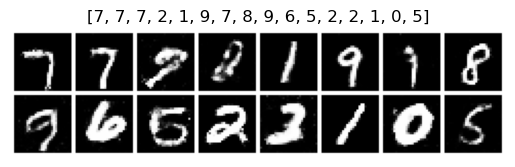

Epoch 220: g_loss: 0.88857126 d_loss: 1.28596175


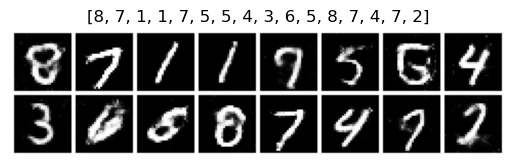

Epoch 221: g_loss: 0.87446332 d_loss: 1.28732657


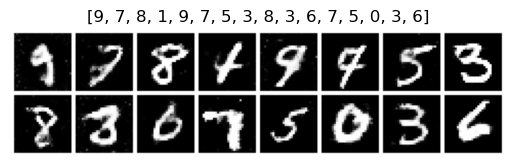

Epoch 222: g_loss: 0.87595463 d_loss: 1.28803694


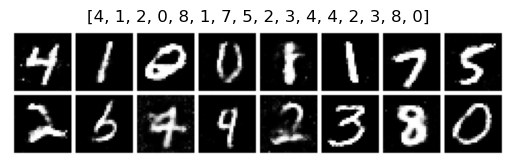

Epoch 223: g_loss: 0.87897336 d_loss: 1.28292537


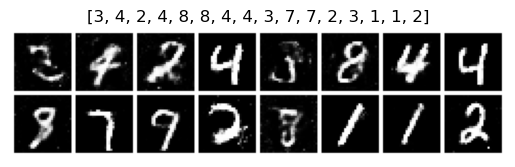

Epoch 224: g_loss: 0.86901015 d_loss: 1.28837788


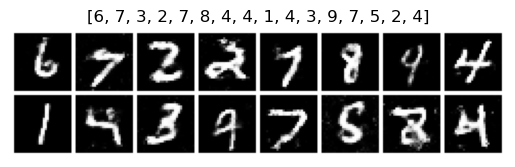

Epoch 225: g_loss: 0.88568693 d_loss: 1.28253782


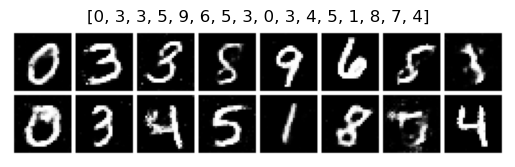

Epoch 226: g_loss: 0.87630343 d_loss: 1.28996968


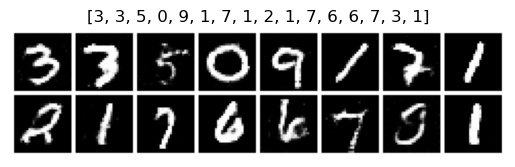

Epoch 227: g_loss: 0.88504976 d_loss: 1.28527665


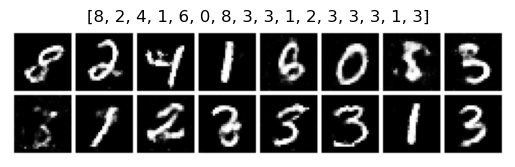

Epoch 228: g_loss: 0.88520151 d_loss: 1.28425658


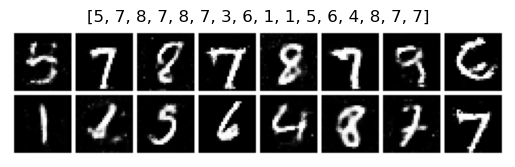

Epoch 229: g_loss: 0.88757670 d_loss: 1.28634989


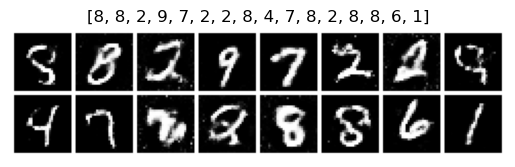

Epoch 230: g_loss: 0.86932725 d_loss: 1.28919435


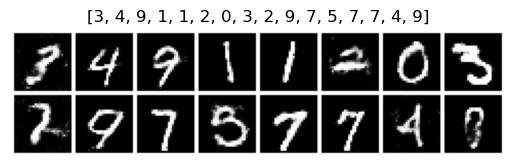

Epoch 231: g_loss: 0.86877018 d_loss: 1.28771758


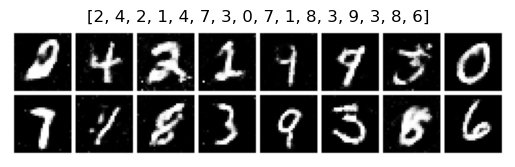

Epoch 232: g_loss: 0.87163448 d_loss: 1.28978586


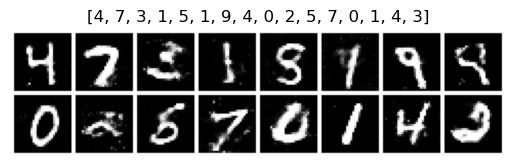

Epoch 233: g_loss: 0.87397999 d_loss: 1.29333580


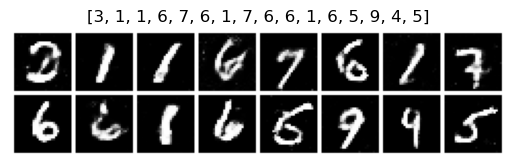

Epoch 234: g_loss: 0.89144063 d_loss: 1.28145623


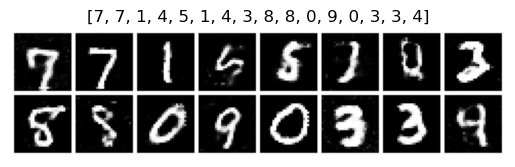

Epoch 235: g_loss: 0.88840145 d_loss: 1.28863192


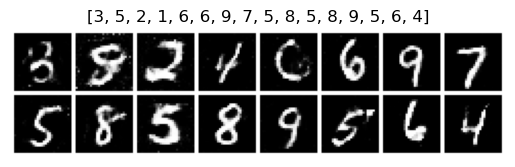

Epoch 236: g_loss: 0.87826961 d_loss: 1.28823555


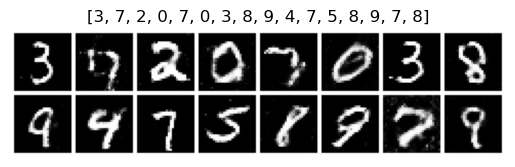

Epoch 237: g_loss: 0.88324636 d_loss: 1.28713632


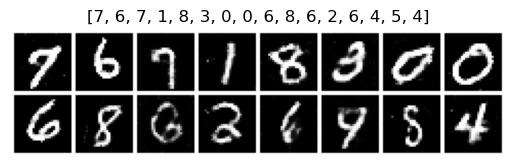

Epoch 238: g_loss: 0.88991427 d_loss: 1.28078413


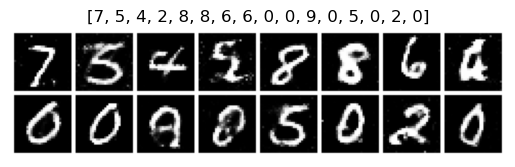

Epoch 239: g_loss: 0.87906140 d_loss: 1.28230369


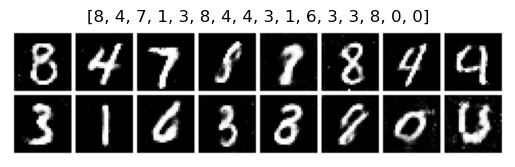

Epoch 240: g_loss: 0.86622804 d_loss: 1.29227519


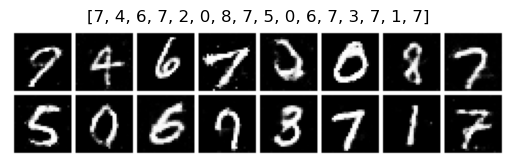

Epoch 241: g_loss: 0.87527746 d_loss: 1.28936708


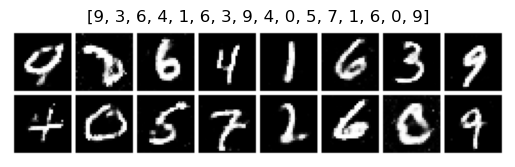

Epoch 242: g_loss: 0.88269019 d_loss: 1.28239036


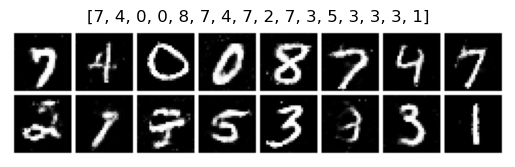

Epoch 243: g_loss: 0.88113129 d_loss: 1.28537357


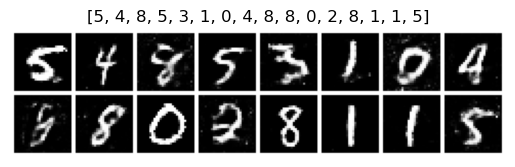

Epoch 244: g_loss: 0.87964571 d_loss: 1.28418040


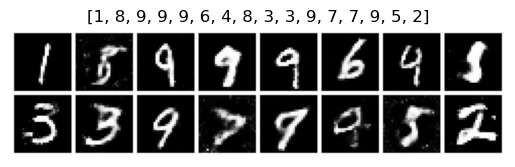

Epoch 245: g_loss: 0.87933767 d_loss: 1.28840995


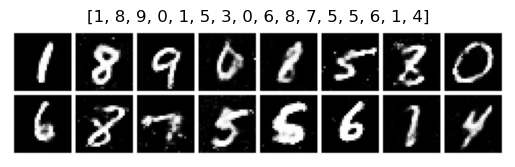

Epoch 246: g_loss: 0.86963940 d_loss: 1.29711509


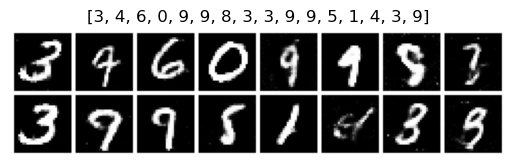

Epoch 247: g_loss: 0.87243223 d_loss: 1.28841913


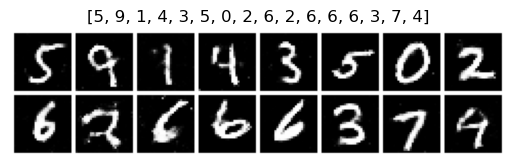

Epoch 248: g_loss: 0.86993814 d_loss: 1.29246604


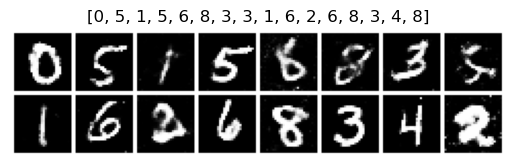

Epoch 249: g_loss: 0.87305784 d_loss: 1.29052246


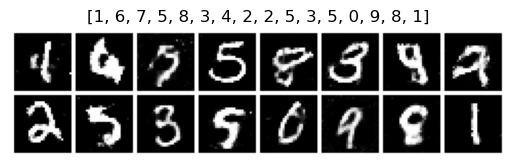

Training Finished


In [5]:
# vanilla gan - https://github.com/safwankdb/Vanilla-GAN/blob/master/Vanilla_GAN.ipynb
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd.variable import Variable
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import imageio
import matplotlib.pyplot as plt
transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,),(0.5,))
                ])
to_image = transforms.ToPILImage()
trainset = MNIST(root='./data/', train=True, download=False, transform=transform)
trainloader = DataLoader(trainset, batch_size=100, shuffle=True)

device = 'mps'
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.n_features = 128
        self.n_out = 784
        self.fc0 = nn.Sequential(
                    nn.Linear(self.n_features, 256),
                    nn.LeakyReLU(0.2)
                    )
        self.fc1 = nn.Sequential(
                    nn.Linear(256, 512),
                    nn.LeakyReLU(0.2)
                    )
        self.fc2 = nn.Sequential(
                    nn.Linear(512, 1024),
                    nn.LeakyReLU(0.2)
                    )
        self.fc3 = nn.Sequential(
                    nn.Linear(1024, self.n_out),
                    nn.Tanh()
                    )
    def forward(self, x):
        x = self.fc0(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = x.view(-1, 1, 28, 28)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_in = 784
        self.n_out = 1
        self.fc0 = nn.Sequential(
                    nn.Linear(self.n_in, 1024),
                    nn.LeakyReLU(0.2),
                    nn.Dropout(0.3)
                    )
        self.fc1 = nn.Sequential(
                    nn.Linear(1024, 512),
                    nn.LeakyReLU(0.2),
                    nn.Dropout(0.3)
                    )
        self.fc2 = nn.Sequential(
                    nn.Linear(512, 256),
                    nn.LeakyReLU(0.2),
                    nn.Dropout(0.3)
                    )
        self.fc3 = nn.Sequential(
                    nn.Linear(256, self.n_out),
                    nn.Sigmoid()
                    )
    def forward(self, x):
        x = x.view(-1, 784)
        x = self.fc0(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x

generator = Generator()
discriminator = Discriminator()

generator.to(device)
discriminator.to(device)

g_optim = optim.Adam(generator.parameters(), lr=2e-4)
d_optim = optim.Adam(discriminator.parameters(), lr=2e-4)

g_losses = []
d_losses = []
images = []

criterion = nn.BCELoss()

def noise(n, n_features=128):
    return Variable(torch.randn(n, n_features)).to(device)

def make_ones(size):
    data = Variable(torch.ones(size, 1))
    return data.to(device)

def make_zeros(size):
    data = Variable(torch.zeros(size, 1))
    return data.to(device)
def train_discriminator(optimizer, real_data, fake_data):
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, make_ones(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, make_zeros(n))
    
    error_fake.backward()
    optimizer.step()
    
    return error_real + error_fake

def train_generator(optimizer, fake_data):
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, make_ones(n))
    
    error.backward()
    optimizer.step()
    
    return error
num_epochs = 250
k = 1
test_noise = noise(64)

generator.train()
discriminator.train()

confidences = []
counts = [0]*10
for epoch in range(num_epochs):
    g_error = 0.0
    d_error = 0.0
    for i, data in enumerate(trainloader):
        imgs, _ = data
        n = len(imgs)
        for j in range(k):
            fake_data = generator(noise(n)).detach()
            real_data = imgs.to(device)
            d_error += train_discriminator(d_optim, real_data, fake_data)
        fake_data = generator(noise(n))
        g_error += train_generator(g_optim, fake_data)

    img = generator(test_noise).cpu().detach()
    img = make_grid(img)
    images.append(img)
    g_losses.append(g_error/i)
    d_losses.append(d_error/i)
    print('Epoch {}: g_loss: {:.8f} d_loss: {:.8f}\r'.format(epoch, g_error/i, d_error/i))

    # Generate 100 samples and count how many of each digit 
    # Define the fixed noise vector for generating samples
    generated_images = generator(noise(100).detach())
    generated_images = 0.5 * (generated_images + 1)
    output = model(generated_images.to(device))
    pred = output.argmax(dim=1, keepdim=True)
    grid = make_grid(generated_images[:16].cpu(), nrow=8, pad_value=1)
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.title([int(pred[x]) for x in range(16)])
    plt.show()
    #print(torch.exp(output[0])) # torch.exp converts the output back into regular softmax probabilities (confidences)
    avg_conf = torch.mean(torch.exp(output).max(dim=1).values)
    confidences.append(avg_conf)
    for p in pred:
        counts[p] += 1
    
print('Training Finished')
torch.save(generator.state_dict(), 'mnist_generator.pth')

In [6]:
import numpy as np
from matplotlib import pyplot as plt
imgs = [np.array(to_image(i)) for i in images]
imageio.mimsave('progress.gif', imgs)

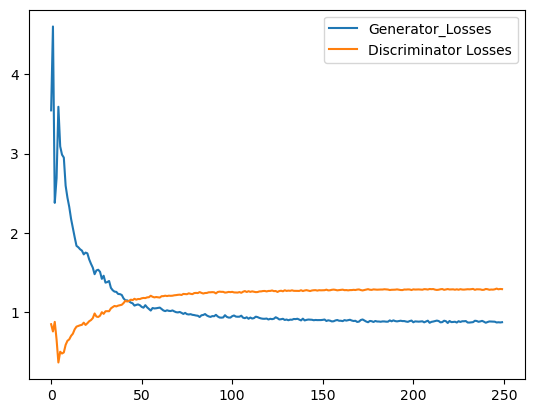

In [8]:
#g_losses = g_losses.to("cpu")
#d_losses = d_losses.to("cpu")
from torch import Tensor
g_losses = [Tensor.cpu(g_loss) for g_loss in g_losses]
d_losses = [Tensor.cpu(d_loss) for d_loss in d_losses]
plt.plot([g_loss.detach() for g_loss in g_losses], label='Generator_Losses')
plt.plot([d_loss.detach() for d_loss in d_losses], label='Discriminator Losses')
plt.legend()
plt.savefig('loss.png')

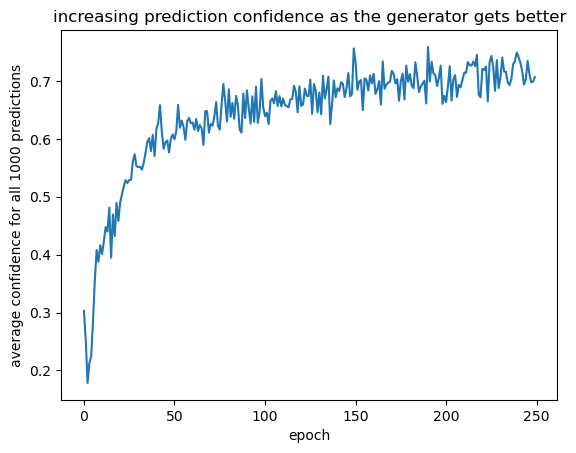

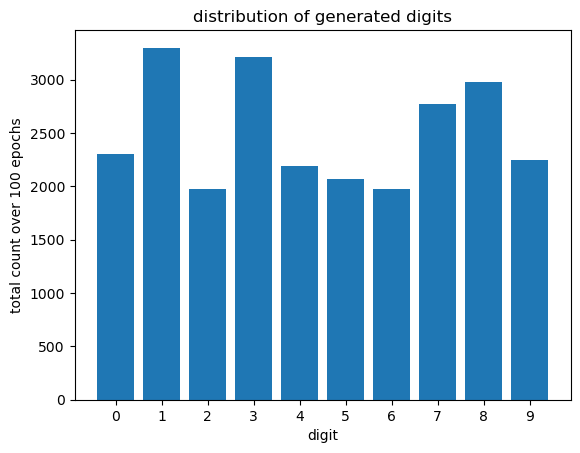

In [9]:
# now let's plot the average confidences in the predictions over the epochs
import matplotlib.pyplot as plt
plt.plot([float(c) for c in confidences])
plt.xlabel("epoch")
plt.ylabel("average confidence for all 1000 predictions")
plt.title("increasing prediction confidence as the generator gets better")
plt.show()

plt.bar([f"{x}" for x in range(10)], counts)
plt.xlabel("digit")
plt.ylabel("total count over 100 epochs")
plt.title("distribution of generated digits")
plt.show()